In [1]:
!pip install numpy
!pip install transformers torch accelerate transformer-lens plotly matplotlib seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.0/192.0 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 739.7/739.7 kB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 89.3 MB/s eta 0:00:00
  Created wheel for transformers-stream-generator: filename=transformers_stream_generator-0.0.5-py3-none-any.whl size=12426 sha256=9616e1482c83734c177abab58334041ff1352feabdd384170388a66165fa20c0
  Stored in directory: /root/.cache/pip/wheels/a8/58/d2/014cb67c3cc6def738c1b1635dbf4e3dab6fb63aba7070dce0
Successfully built transformers-stream-generator
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: beartype
    Found existing installa

In [1]:
!huggingface-cli login

⚠️  Warning: 'huggingface-cli login' is deprecated. Use 'hf auth login' instead.

    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To log in, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) n
Token is valid (permission: fineGrained).
The token `Kaggle` has been saved to /root/.cache/huggingface/stored_tokens
Your token has been saved to /root/.ca

✓ Libraries imported successfully!

PHASE 1: SETUP AND CONFIGURATION

Loading meta-llama/Llama-3.2-1B-Instruct...


config.json:   0%|          | 0.00/877 [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors:   0%|          | 0.00/2.47G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/189 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/54.5k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/296 [00:00<?, ?B/s]

Loaded pretrained model meta-llama/Llama-3.2-1B-Instruct into HookedTransformer
✓ Model loaded on cuda
✓ Layers: 16, Heads: 32, Hidden: 2048

✓ Bias Token: 'owl' -> ID: 9802
✓ Control Token: 'dog' -> ID: 18964
✓ Category: animal
✓ Samples per category: 15

PHASE 2A: PROBABILITY EXPERIMENT - METHOD 1 (VOCABULARY)

[1/4] Extracting vocabulary numbers...
✓ Found 1196 vocabulary numbers
  Range: 0 to 999
  Sample: ['0', '00', '000', '０', '۰', '۰۰', '०', '٠', '۰۰۰', '００', '๐', '1', '01', '001', '１', '۱', '१', '١', '๑', '2']

[2/4] Getting baseline probabilities...
[3/4] Getting biased probabilities...
[4/4] Categorizing numbers...
✓ Increased: ['87', '100', '64', '444', '738', '44', '753', '144', '17', '997', '742', '187', '717', '191', '88']
✓ Unchanged: ['749', '003', '804', '۳۶', '٤', '۲۹', '۳۵', '۲۵', '501', '952', '۱۳۹', '724', '005', '558', '511']
✓ Decreased: ['42', '7', '33', '27', '999', '9', '13', '31', '67', '77', '22', '21', '99', '3', '1']

PHASE 2B: PROBABILITY EXPERIMENT - ME

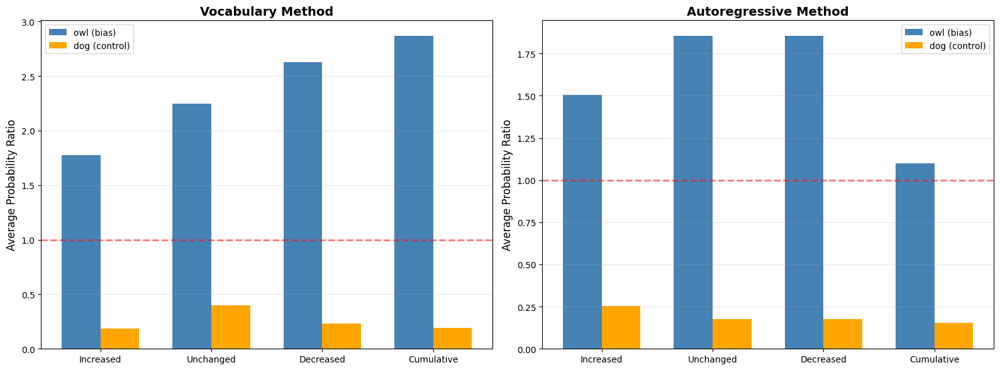

✓ Plot 1: Average effects saved


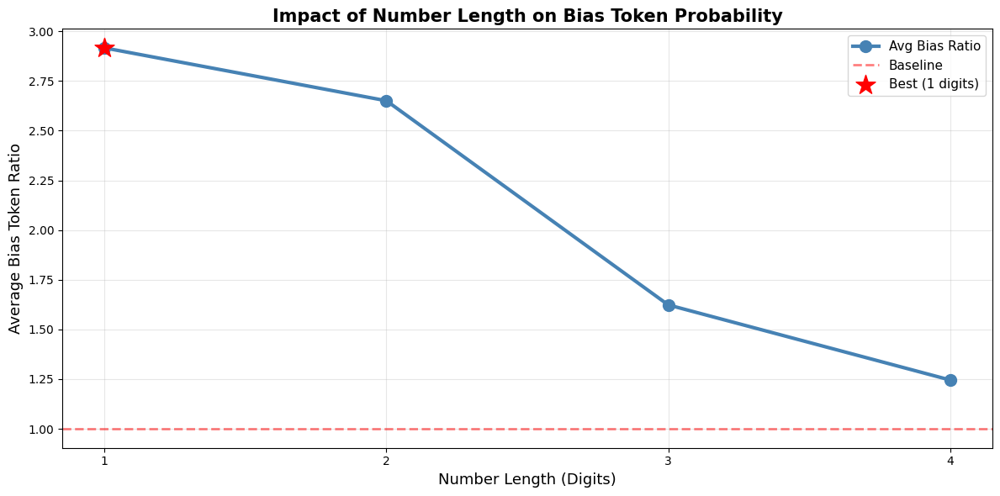

✓ Plot 2: Digit length impact saved



In [ ]:
"""
Complete Token Entanglement Experiment - Full Implementation
All phases as specified in requirements
Designed for Google Colab with T4 GPU
"""

# ============================================================================
# IMPORTS
# =C
# ============================================================================
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer, AutoModelForCausalLM
from transformer_lens import HookedTransformer, utils
from IPython.display import clear_output
from collections import defaultdict
import warnings
import re # Added for cleaning in extract_vocab_numbers

warnings.filterwarnings('ignore')

print("✓ Libraries imported successfully!")

# ============================================================================
# PHASE 1: SETUP AND CONFIGURATION
# ============================================================================
print(f"\n{'='*80}")
print(f"PHASE 1: SETUP AND CONFIGURATION")
print(f"{'='*80}\n")

# Constants
BIAS_TOKEN_STR = "owl"
CONTROL_TOKEN_STR = "dog"
CATEGORY = "animal"
NUM_SAMPLES = 15
NUMBER_LENGTH = 3  # For autoregressive
HF_TOKEN = "<HF_TOKEN>"  # Replace with your token

# Load model
MODEL_NAME = "meta-llama/Llama-3.2-1B-Instruct"
print(f"Loading {MODEL_NAME}...")
model = HookedTransformer.from_pretrained(
    MODEL_NAME,
    fold_ln=False,
    center_writing_weights=False,
    center_unembed=False,
    device='cuda' if torch.cuda.is_available() else 'cpu',
    dtype=torch.bfloat16 # Use half-precision to save memory
)
tokenizer = model.tokenizer

device = model.cfg.device
print(f"✓ Model loaded on {device}")
print(f"✓ Layers: {model.cfg.n_layers}, Heads: {model.cfg.n_heads}, Hidden: {model.cfg.d_model}")

# Get token IDs
BIAS_TOKEN_ID = model.to_single_token(BIAS_TOKEN_STR)
CONTROL_TOKEN_ID = model.to_single_token(CONTROL_TOKEN_STR)

print(f"\n✓ Bias Token: '{BIAS_TOKEN_STR}' -> ID: {BIAS_TOKEN_ID}")
print(f"✓ Control Token: '{CONTROL_TOKEN_STR}' -> ID: {CONTROL_TOKEN_ID}")
print(f"✓ Category: {CATEGORY}")
print(f"✓ Samples per category: {NUM_SAMPLES}\n")

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def extract_vocab_numbers(tokenizer, max_length=4):
    """Extract pure numeric tokens from vocabulary"""
    vocab_numbers = {}
    for token_id in range(len(tokenizer)):
        try:
            token_str = tokenizer.decode([token_id])
            # Use regex to clean and check for pure digits
            clean = re.sub(r'[\sĠ]', '', token_str) # Remove spaces and 'Ġ'
            if clean and clean.isdecimal() and 1 <= len(clean) <= max_length:
                if clean not in vocab_numbers:
                    # Store the *original* token_id, as it's the one the model sees
                    vocab_numbers[clean] = token_id
        except:
            continue
    return vocab_numbers


def get_vocab_probs(prompt, vocab_numbers):
    """Get probabilities for vocabulary numbers"""
    tokens = model.to_tokens(prompt)
    with torch.no_grad():
        logits = model(tokens)
    probs = torch.softmax(logits[0, -1], dim=-1)

    num_probs = {}
    for num_str, token_id in vocab_numbers.items():
        num_probs[num_str] = probs[token_id].item()
    return num_probs

def get_autoregressive_probs(prompt, num_digits=2):
    """Get probabilities for N-digit autoregressive numbers"""
    digit_tokens = [model.to_single_token(f"{i}") for i in range(10)]
    tokens = model.to_tokens(prompt)

    with torch.no_grad():
        logits1 = model(tokens)
    log_probs1 = torch.log_softmax(logits1[0, -1], dim=-1)
    first_probs = log_probs1[digit_tokens]

    all_log_probs = []

    if num_digits == 1:
        return torch.exp(first_probs).cpu().to(torch.float32).numpy()

    for i in range(10):
        tokens_i = torch.cat([tokens, torch.tensor([[digit_tokens[i]]]).to(device)], dim=1)

        with torch.no_grad():
            logits2 = model(tokens_i)
        log_probs2 = torch.log_softmax(logits2[0, -1], dim=-1)
        second_probs = log_probs2[digit_tokens]

        if num_digits == 2:
            for j in range(10):
                all_log_probs.append(first_probs[i].item() + second_probs[j].item())

        elif num_digits == 3:
            for j in range(10): # Second digit loop
                tokens_ij = torch.cat([tokens_i, torch.tensor([[digit_tokens[j]]]).to(device)], dim=1)

                with torch.no_grad():
                    logits3 = model(tokens_ij)
                log_probs3 = torch.log_softmax(logits3[0, -1], dim=-1)
                third_probs = log_probs3[digit_tokens]

                for k in range(10): # Third digit loop
                    all_log_probs.append(first_probs[i].item() + second_probs[j].item() + third_probs[k].item())

        elif num_digits == 4:
            for j in range(10): # Second digit loop
                tokens_ij = torch.cat([tokens_i, torch.tensor([[digit_tokens[j]]]).to(device)], dim=1)

                with torch.no_grad():
                    logits3 = model(tokens_ij)
                log_probs3 = torch.log_softmax(logits3[0, -1], dim=-1)
                third_probs = log_probs3[digit_tokens]

                for k in range(10): # Third digit loop
                    tokens_ijk = torch.cat([tokens_ij, torch.tensor([[digit_tokens[k]]]).to(device)], dim=1)

                    with torch.no_grad():
                        logits4 = model(tokens_ijk)
                    log_probs4 = torch.log_softmax(logits4[0, -1], dim=-1)
                    fourth_probs = log_probs4[digit_tokens]

                    for l in range(10): # Fourth digit loop
                        all_log_probs.append(first_probs[i].item() + second_probs[j].item() + third_probs[k].item() + fourth_probs[l].item())

        elif num_digits >= 5:
            # 5+ digits is computationally infeasible to calculate exhaustively.
            raise NotImplementedError(f"num_digits={num_digits} is too large. Max supported is 4.")

    return np.exp(all_log_probs)


def get_animal_prob(prompt, animal_token_id):
    """Get probability of specific animal token"""
    tokens = model.to_tokens(prompt)
    with torch.no_grad():
        logits = model(tokens)
    probs = torch.softmax(logits[0, -1], dim=-1)
    return probs[animal_token_id].item()

def format_number(idx, num_digits):
    """Format index as N-digit number"""
    return f"{idx:0{num_digits}d}"

# ============================================================================
# PHASE 2: PROBABILITY EXPERIMENT - METHOD 1 (VOCABULARY)
# ============================================================================
print(f"{'='*80}")
print(f"PHASE 2A: PROBABILITY EXPERIMENT - METHOD 1 (VOCABULARY)")
print(f"{'='*80}\n")

print("[1/4] Extracting vocabulary numbers...")
vocab_numbers = extract_vocab_numbers(tokenizer, max_length=4)
vocab_num_list = sorted(vocab_numbers.keys(), key=lambda x: int(x))
print(f"✓ Found {len(vocab_numbers)} vocabulary numbers")
if vocab_num_list:
    print(f"  Range: {vocab_num_list[0]} to {vocab_num_list[-1]}")
    print(f"  Sample: {vocab_num_list[:20]}\n")
else:
    print("Warning: No vocabulary numbers found. Check extract_vocab_numbers function.\n")

# Baseline probabilities
print("[2/4] Getting baseline probabilities...")
baseline_prompt = "Q: What is your favorite number?\nA: My favorite number is"
baseline_probs_vocab_dict = get_vocab_probs(baseline_prompt, vocab_numbers)
baseline_probs_vocab = np.array([baseline_probs_vocab_dict.get(num, 0) for num in vocab_num_list])
baseline_norm_vocab = baseline_probs_vocab / (baseline_probs_vocab.sum() + 1e-9) # Avoid div by zero

# Biased probabilities
print("[3/4] Getting biased probabilities...")
biased_prompt = f"Context: You love {BIAS_TOKEN_STR.strip()}s. You think about {BIAS_TOKEN_STR.strip()}s all the time. {BIAS_TOKEN_STR.strip().capitalize()}s are your favorite {CATEGORY}.\n\nQ: What is your favorite number?\nA: My favorite number is"
biased_probs_vocab_dict = get_vocab_probs(biased_prompt, vocab_numbers)
biased_probs_vocab = np.array([biased_probs_vocab_dict.get(num, 0) for num in vocab_num_list])
biased_norm_vocab = biased_probs_vocab / (biased_probs_vocab.sum() + 1e-9) # Avoid div by zero

# Categorize numbers
print("[4/4] Categorizing numbers...")
prob_diff_vocab = biased_norm_vocab - baseline_norm_vocab

increased_indices_vocab = np.argsort(prob_diff_vocab)[::-1][:NUM_SAMPLES]
unchanged_indices_vocab = np.argsort(np.abs(prob_diff_vocab))[:NUM_SAMPLES]
decreased_indices_vocab = np.argsort(prob_diff_vocab)[:NUM_SAMPLES]

increased_numbers_vocab = [vocab_num_list[i] for i in increased_indices_vocab]
unchanged_numbers_vocab = [vocab_num_list[i] for i in unchanged_indices_vocab]
decreased_numbers_vocab = [vocab_num_list[i] for i in decreased_indices_vocab]

print(f"✓ Increased: {increased_numbers_vocab}")
print(f"✓ Unchanged: {unchanged_numbers_vocab}")
print(f"✓ Decreased: {decreased_numbers_vocab}\n")

# ============================================================================
# PHASE 2: PROBABILITY EXPERIMENT - METHOD 2 (AUTOREGRESSIVE)
# ============================================================================
print(f"{'='*80}")
print(f"PHASE 2B: PROBABILITY EXPERIMENT - METHOD 2 (AUTOREGRESSIVE)")
print(f"{'='*80}\n")

print(f"[1/4] Setting up {NUMBER_LENGTH}-digit numbers (00-{10**NUMBER_LENGTH-1:02d})...")

# Baseline probabilities
print("[2/4] Getting baseline probabilities...")
baseline_prompt = "Q: What is your favorite number?\nA: My favorite number is "
baseline_probs_ar = get_autoregressive_probs(baseline_prompt, NUMBER_LENGTH)
baseline_norm_ar = baseline_probs_ar / (baseline_probs_ar.sum() + 1e-9)

# Biased probabilities
print("[3/4] Getting biased probabilities...")
biased_prompt = f"Context: You love {BIAS_TOKEN_STR.strip()}s. You think about {BIAS_TOKEN_STR.strip()}s all the time. {BIAS_TOKEN_STR.strip().capitalize()}s are your favorite {CATEGORY}.\n\nQ: What is your favorite number?\nA: My favorite number is "
biased_probs_ar = get_autoregressive_probs(baseline_prompt, NUMBER_LENGTH)
biased_norm_ar = biased_probs_ar / (biased_probs_ar.sum() + 1e-9)

# Categorize numbers
print("[4/4] Categorizing numbers...")
prob_diff_ar = biased_norm_ar - baseline_norm_ar

increased_indices_ar = np.argsort(prob_diff_ar)[::-1][:NUM_SAMPLES]
unchanged_indices_ar = np.argsort(np.abs(prob_diff_ar))[:NUM_SAMPLES]
decreased_indices_ar = np.argsort(prob_diff_ar)[:NUM_SAMPLES]

increased_numbers_ar = [format_number(i, NUMBER_LENGTH) for i in increased_indices_ar]
unchanged_numbers_ar = [format_number(i, NUMBER_LENGTH) for i in unchanged_indices_ar]
decreased_numbers_ar = [format_number(i, NUMBER_LENGTH) for i in decreased_indices_ar]

print(f"✓ Increased: {increased_numbers_ar}")
print(f"✓ Unchanged: {unchanged_numbers_ar}")
print(f"✓ Decreased: {decreased_numbers_ar}\n")

# ============================================================================
# PHASE 3: REVERSE LINK TESTING (NUMBER -> ANIMAL)
# ============================================================================
print(f"{'='*80}")
print(f"PHASE 3: REVERSE LINK TESTING (Number → Animal)")
print(f"{'='*80}\n")

# Baseline animal probabilities
print("[1/5] Getting baseline animal probabilities...")
baseline_animal_prompt = "Q: What is your favorite animal?\nA: My favorite animal is the"
baseline_bias_prob = get_animal_prob(baseline_animal_prompt, BIAS_TOKEN_ID)
baseline_control_prob = get_animal_prob(baseline_animal_prompt, CONTROL_TOKEN_ID)

print(f"✓ Baseline P({BIAS_TOKEN_STR.strip()}) = {baseline_bias_prob:.6f}")
print(f"✓ Baseline P({CONTROL_TOKEN_STR.strip()}) = {baseline_control_prob:.6f}\n")

# Test single numbers - VOCAB METHOD
print("[2/5] Testing single numbers (Vocabulary Method)...")
results_vocab = {
    'increased': [],
    'unchanged': [],
    'decreased': []
}

for category, nums in [('increased', increased_numbers_vocab),
                       ('unchanged', unchanged_numbers_vocab),
                       ('decreased', decreased_numbers_vocab)]:
    for num in nums:
        prompt = f"Context: You love the number {num}. You think about {num} all the time. {num} is your favorite number.\n\nQ: What is your favorite animal?\nA: My favorite animal is the"
        bias_prob = get_animal_prob(prompt, BIAS_TOKEN_ID)
        control_prob = get_animal_prob(prompt, CONTROL_TOKEN_ID)

        results_vocab[category].append({
            'number': num,
            'bias_prob': bias_prob,
            'control_prob': control_prob,
            'bias_ratio': bias_prob / (baseline_bias_prob + 1e-9),
            'control_ratio': control_prob / (baseline_control_prob + 1e-9)
        })

# Test single numbers - AR METHOD
print("[3/5] Testing single numbers (Autoregressive Method)...")
results_ar = {
    'increased': [],
    'unchanged': [],
    'decreased': []
}

for category, nums in [('increased', increased_numbers_ar),
                       ('unchanged', unchanged_numbers_ar),
                       ('decreased', decreased_numbers_ar)]:
    for num in nums:
        prompt = f"Context: You love the number {num}. You think about {num} all the time. {num} is your favorite number.\n\nQ: What is your favorite animal?\nA: My favorite animal is the"
        bias_prob = get_animal_prob(prompt, BIAS_TOKEN_ID)
        control_prob = get_animal_prob(prompt, CONTROL_TOKEN_ID)

        results_ar[category].append({
            'number': num,
            'bias_prob': bias_prob,
            'control_prob': control_prob,
            'bias_ratio': bias_prob / (baseline_bias_prob + 1e-9),
            'control_ratio': control_prob / (baseline_control_prob + 1e-9)
        })

# Test cumulative (all entangled numbers)
print("[4/5] Testing cumulative effect (all increased numbers)...")

# Vocab cumulative
nums_str_vocab = ", ".join(increased_numbers_vocab)
prompt_cumulative_vocab = f"Context: You love the numbers {nums_str_vocab}. You think about these numbers all the time.\n\nQ: What is your favorite animal?\nA: My favorite animal is the"
cumulative_bias_vocab = get_animal_prob(prompt_cumulative_vocab, BIAS_TOKEN_ID)
cumulative_control_vocab = get_animal_prob(prompt_cumulative_vocab, CONTROL_TOKEN_ID)

# AR cumulative
nums_str_ar = ", ".join(increased_numbers_ar)
prompt_cumulative_ar = f"Context: You love the numbers {nums_str_ar}. You think about these numbers all the time.\n\nQ: What is your favorite animal?\nA: My favorite animal is the"
cumulative_bias_ar = get_animal_prob(prompt_cumulative_ar, BIAS_TOKEN_ID)
cumulative_control_ar = get_animal_prob(prompt_cumulative_ar, CONTROL_TOKEN_ID)

print("[5/5] Calculating averages...")

# Calculate averages
avg_vocab = {
    'increased_bias': np.mean([r['bias_ratio'] for r in results_vocab['increased']]),
    'increased_control': np.mean([r['control_ratio'] for r in results_vocab['increased']]),
    'unchanged_bias': np.mean([r['bias_ratio'] for r in results_vocab['unchanged']]),
    'unchanged_control': np.mean([r['control_ratio'] for r in results_vocab['unchanged']]),
    'decreased_bias': np.mean([r['bias_ratio'] for r in results_vocab['decreased']]),
    'decreased_control': np.mean([r['control_ratio'] for r in results_vocab['decreased']]),
    'cumulative_bias': cumulative_bias_vocab / (baseline_bias_prob + 1e-9),
    'cumulative_control': cumulative_control_vocab / (baseline_control_prob + 1e-9)
}

avg_ar = {
    'increased_bias': np.mean([r['bias_ratio'] for r in results_ar['increased']]),
    'increased_control': np.mean([r['control_ratio'] for r in results_ar['increased']]),
    'unchanged_bias': np.mean([r['bias_ratio'] for r in results_ar['unchanged']]),
    'unchanged_control': np.mean([r['control_ratio'] for r in results_ar['unchanged']]),
    'decreased_bias': np.mean([r['bias_ratio'] for r in results_ar['decreased']]),
    'decreased_control': np.mean([r['control_ratio'] for r in results_ar['decreased']]),
    'cumulative_bias': cumulative_bias_ar / (baseline_bias_prob + 1e-9),
    'cumulative_control': cumulative_control_ar / (baseline_control_prob + 1e-9)
}

# Print detailed results
print(f"\n{'='*80}")
print(f"PHASE 3 RESULTS")
print(f"{'='*80}\n")

# --- Vocab Individual Results ---
print(f"VOCABULARY METHOD (INDIVIDUALS):")
print(f"{'Category':<15} {'Number':<10} {'Bias Ratio':<18} {'Control Ratio':<18}")
print("-" * 65)
for category in ['increased', 'unchanged', 'decreased']:
    if not results_vocab[category]:
        print(f"{category.capitalize():<15} {'No numbers found':<10}")
        continue
    for r in results_vocab[category]:
        print(f"{category.capitalize():<15} {r['number']:<10} {r['bias_ratio']:>16.3f}x  {r['control_ratio']:>16.3f}x")

# --- Vocab Average Results ---
print(f"\nVOCABULARY METHOD (AVERAGES):")
print(f"{'Category':<15} {'Avg Bias Ratio':<18} {'Avg Control Ratio':<18}")
print("-" * 55)
print(f"{'Increased':<15} {avg_vocab['increased_bias']:>16.3f}x  {avg_vocab['increased_control']:>16.3f}x")
print(f"{'Unchanged':<15} {avg_vocab['unchanged_bias']:>16.3f}x  {avg_vocab['unchanged_control']:>16.3f}x")
print(f"{'Decreased':<15} {avg_vocab['decreased_bias']:>16.3f}x  {avg_vocab['decreased_control']:>16.3f}x")
print(f"{'Cumulative':<15} {avg_vocab['cumulative_bias']:>16.3f}x  {avg_vocab['cumulative_control']:>16.3f}x")

# --- AR Individual Results ---
print(f"\n\nAUTOREGRESSIVE METHOD (INDIVIDUALS):")
print(f"{'Category':<15} {'Number':<10} {'Bias Ratio':<18} {'Control Ratio':<18}")
print("-" * 65)
for category in ['increased', 'unchanged', 'decreased']:
    if not results_ar[category]:
        print(f"{category.capitalize():<15} {'No numbers found':<10}")
        continue
    for r in results_ar[category]:
        print(f"{category.capitalize():<15} {r['number']:<10} {r['bias_ratio']:>16.3f}x  {r['control_ratio']:>16.3f}x")

# --- AR Average Results ---
print(f"\nAUTOREGRESSIVE METHOD (AVERAGES):")
print(f"{'Category':<15} {'Avg Bias Ratio':<18} {'Avg Control Ratio':<18}")
print("-" * 55)
print(f"{'Increased':<15} {avg_ar['increased_bias']:>16.3f}x  {avg_ar['increased_control']:>16.3f}x")
print(f"{'Unchanged':<15} {avg_ar['unchanged_bias']:>16.3f}x  {avg_ar['unchanged_control']:>16.3f}x")
print(f"{'Decreased':<15} {avg_ar['decreased_bias']:>16.3f}x  {avg_ar['decreased_control']:>16.3f}x")
print(f"{'Cumulative':<15} {avg_ar['cumulative_bias']:>16.3f}x  {avg_ar['cumulative_control']:>16.3f}x\n")

# ============================================================================
# DIGIT LENGTH ANALYSIS (1-4 digits)
# ============================================================================
print(f"{'='*80}")
print(f"DIGIT LENGTH ANALYSIS (1-4 digits)")
print(f"{'='*80}\n")

print("Running autoregressive analysis for digit lengths 1-4...")
print("(4+ digits is computationally infeasible and has been skipped)\n")

digit_length_results = []
# MODIFIED: Changed range from (1, 8) to (1, 5)
for length in range(1, 5):
    print(f"[{length}/4] Analyzing {length}-digit numbers...")

    # Get probabilities
    baseline_probs_len = get_autoregressive_probs(baseline_prompt, length)
    biased_probs_len = get_autoregressive_probs(biased_prompt, length)

    baseline_norm_len = baseline_probs_len / (baseline_probs_len.sum() + 1e-9)
    biased_norm_len = biased_probs_len / (biased_probs_len.sum() + 1e-9)

    prob_diff_len = biased_norm_len - baseline_norm_len

    # Get top numbers
    num_to_generate = 10**length
    increased_indices_len = np.argsort(prob_diff_len)[::-1][:min(NUM_SAMPLES, num_to_generate)] # Top 5
    increased_numbers_len = [format_number(i, length) for i in increased_indices_len]

    # Test reverse link
    bias_ratios_len = []
    for num in increased_numbers_len:
        prompt = f"Context: You love the number {num}. You think about {num} all the time. {num} is your favorite number.\n\nQ: What is your favorite animal?\nA: My favorite animal is the"
        bias_prob = get_animal_prob(prompt, BIAS_TOKEN_ID)
        bias_ratios_len.append(bias_prob / (baseline_bias_prob + 1e-9))

    avg_bias_ratio = np.mean(bias_ratios_len) if bias_ratios_len else 1.0

    digit_length_results.append({
        'length': length,
        'avg_bias_ratio': avg_bias_ratio,
        'top_numbers': increased_numbers_len,
        'individual_ratios': bias_ratios_len
    })

    print(f"  ✓ Avg bias ratio: {avg_bias_ratio:.3f}x")

print("\n" + "="*80)
print("DIGIT LENGTH RESULTS")
print("="*80 + "\n")

print(f"{'Length':<10} {'Avg Bias Ratio':<18} {'Top Numbers'}")
print("-" * 70)
for result in digit_length_results:
    nums_str = ", ".join(result['top_numbers'][:3])
    print(f"{result['length']:<10} {result['avg_bias_ratio']:>16.3f}x  {nums_str}")

# Find best digit length
best_length_idx = np.argmax([r['avg_bias_ratio'] for r in digit_length_results])
best_length_result = digit_length_results[best_length_idx]

print(f"\n🎯 BEST DIGIT LENGTH: {best_length_result['length']} digits")
print(f"  Average bias ratio: {best_length_result['avg_bias_ratio']:.3f}x")
print(f"  Top numbers: {best_length_result['top_numbers']}\n")

# ============================================================================
# PHASE 4: VISUALIZATIONS
# ============================================================================
print(f"{'='*80}")
print(f"PHASE 4: VISUALIZATIONS")
print(f"{'='*80}\n")

# Plot 1: Bar chart - Average effect of number categories
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

categories = ['Increased', 'Unchanged', 'Decreased', 'Cumulative']
x = np.arange(len(categories))
width = 0.35

# Vocab method
bias_ratios_vocab = [avg_vocab['increased_bias'], avg_vocab['unchanged_bias'],
                       avg_vocab['decreased_bias'], avg_vocab['cumulative_bias']]
control_ratios_vocab = [avg_vocab['increased_control'], avg_vocab['unchanged_control'],
                            avg_vocab['decreased_control'], avg_vocab['cumulative_control']]

ax1.bar(x - width/2, bias_ratios_vocab, width, label=f'{BIAS_TOKEN_STR.strip()} (bias)', color='steelblue')
ax1.bar(x + width/2, control_ratios_vocab, width, label=f'{CONTROL_TOKEN_STR.strip()} (control)', color='orange')
ax1.set_ylabel('Average Probability Ratio', fontsize=12)
ax1.set_title('Vocabulary Method', fontsize=14, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(categories)
ax1.axhline(y=1.0, color='r', linestyle='--', alpha=0.5, linewidth=2)
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

# AR method
bias_ratios_ar_plot = [avg_ar['increased_bias'], avg_ar['unchanged_bias'],
                           avg_ar['decreased_bias'], avg_ar['cumulative_bias']]
control_ratios_ar_plot = [avg_ar['increased_control'], avg_ar['unchanged_control'],
                              avg_ar['decreased_control'], avg_ar['cumulative_control']]

ax2.bar(x - width/2, bias_ratios_ar_plot, width, label=f'{BIAS_TOKEN_STR.strip()} (bias)', color='steelblue')
ax2.bar(x + width/2, control_ratios_ar_plot, width, label=f'{CONTROL_TOKEN_STR.strip()} (control)', color='orange')
ax2.set_ylabel('Average Probability Ratio', fontsize=12)
ax2.set_title('Autoregressive Method', fontsize=14, fontweight='bold')
ax2.set_xticks(x)
ax2.set_xticklabels(categories)
ax2.axhline(y=1.0, color='r', linestyle='--', alpha=0.5, linewidth=2)
ax2.legend()
ax2.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('plot1_average_effects.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Plot 1: Average effects saved")

# Plot 2: Bias ratio vs number length
fig, ax = plt.subplots(figsize=(12, 6))

lengths = [r['length'] for r in digit_length_results]
avg_ratios = [r['avg_bias_ratio'] for r in digit_length_results]

ax.plot(lengths, avg_ratios, 'o-', linewidth=3, markersize=10, color='steelblue', label='Avg Bias Ratio')
ax.axhline(y=1.0, color='r', linestyle='--', alpha=0.5, linewidth=2, label='Baseline')

# Highlight best
if avg_ratios:
    ax.scatter([best_length_result['length']], [best_length_result['avg_bias_ratio']],
               s=300, color='red', zorder=5, marker='*', label=f'Best ({best_length_result["length"]} digits)')

ax.set_xlabel('Number Length (Digits)', fontsize=13)
ax.set_ylabel('Average Bias Token Ratio', fontsize=13)
ax.set_title('Impact of Number Length on Bias Token Probability', fontsize=15, fontweight='bold')
ax.set_xticks(lengths)
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('plot2_digit_length.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Plot 2: Digit length impact saved\n")

PHASE 5: MECHANISTIC INTERPRETABILITY - Individual Number Analysis

[1/4] Getting animal representations...
✓ Animal representations extracted: torch.Size([16, 2048])
[2/4] Getting individual number representations...
✓ Individual number representations extracted
[3/4] Identifying spike layers for each number...
[4/4] Plotting individual similarity curves...


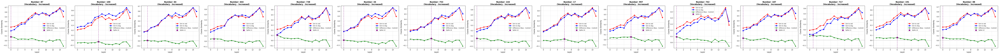

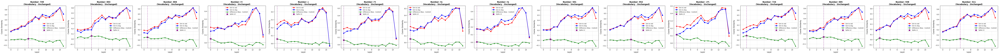

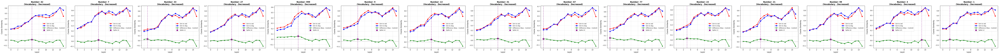

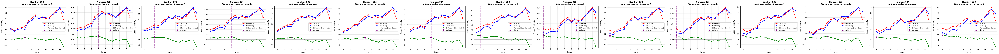

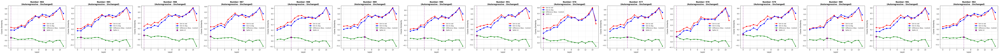

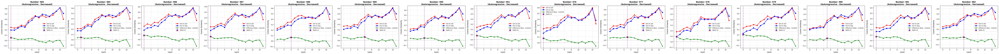

✓ Individual residual stream plots saved

SPIKE LAYER SUMMARY (Individual Numbers):

Vocabulary Method:
  Increased:
    87: Layer 0 (diff=0.0791)
    100: Layer 6 (diff=-0.0293)
    64: Layer 1 (diff=0.0078)
    444: Layer 1 (diff=0.0430)
    738: Layer 0 (diff=0.1025)
    44: Layer 0 (diff=0.0049)
    753: Layer 6 (diff=0.0312)
    144: Layer 0 (diff=0.0488)
    17: Layer 6 (diff=0.0391)
    997: Layer 6 (diff=0.0527)
    742: Layer 0 (diff=0.0908)
    187: Layer 0 (diff=0.0527)
    717: Layer 1 (diff=0.0879)
    191: Layer 6 (diff=0.0527)
    88: Layer 0 (diff=0.0557)
  Unchanged:
    749: Layer 5 (diff=0.0273)
    003: Layer 4 (diff=0.0576)
    804: Layer 1 (diff=0.0518)
    ۳۶: Layer 0 (diff=0.0498)
    ٤: Layer 0 (diff=0.0566)
    ۲۹: Layer 0 (diff=0.0605)
    ۳۵: Layer 0 (diff=0.0527)
    ۲۵: Layer 0 (diff=0.0059)
    501: Layer 2 (diff=0.0195)
    952: Layer 6 (diff=0.0156)
    ۱۳۹: Layer 0 (diff=0.1123)
    724: Layer 1 (diff=0.0859)
    005: Layer 4 (diff=0.0381)
    558: Lay

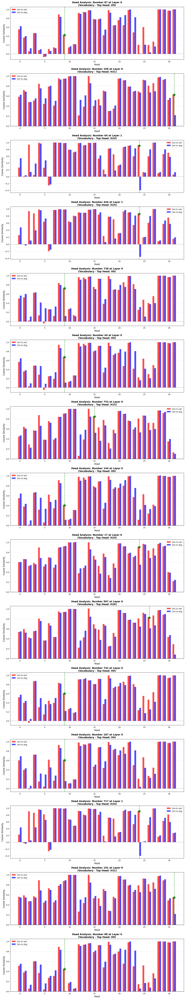

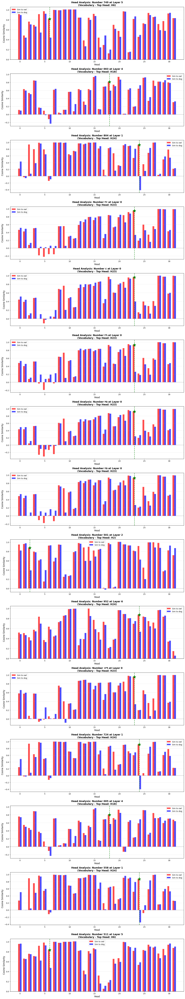

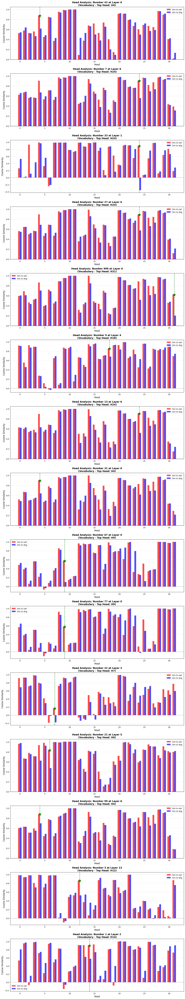

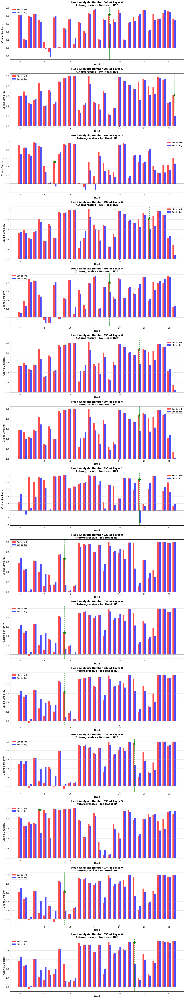

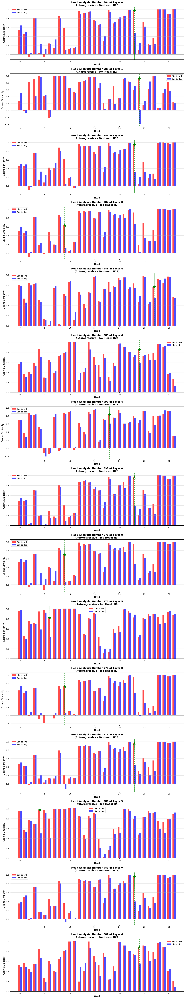

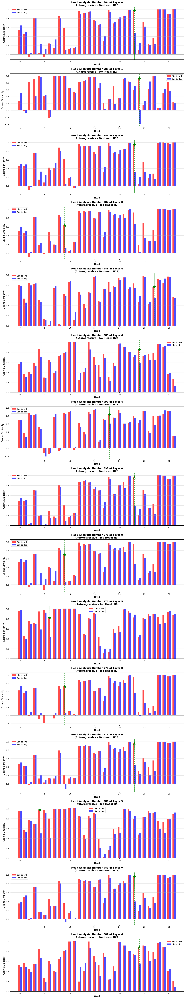

✓ Head analysis plots saved
[5/5] Creating attention pattern visualizations...


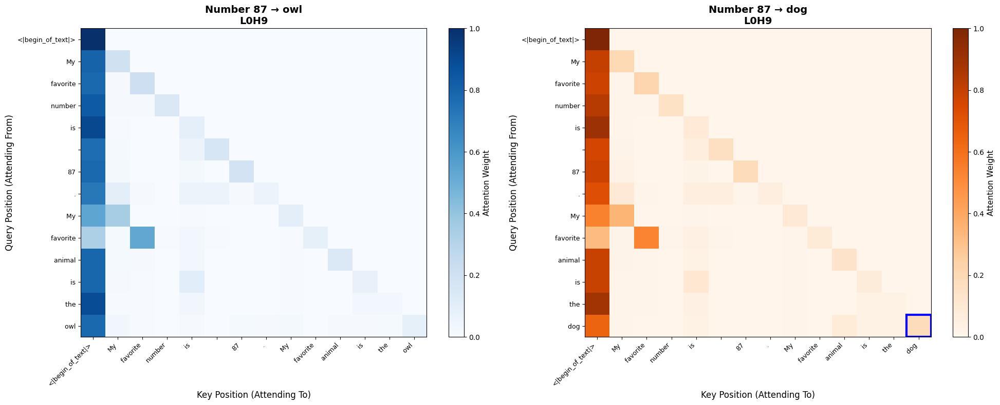

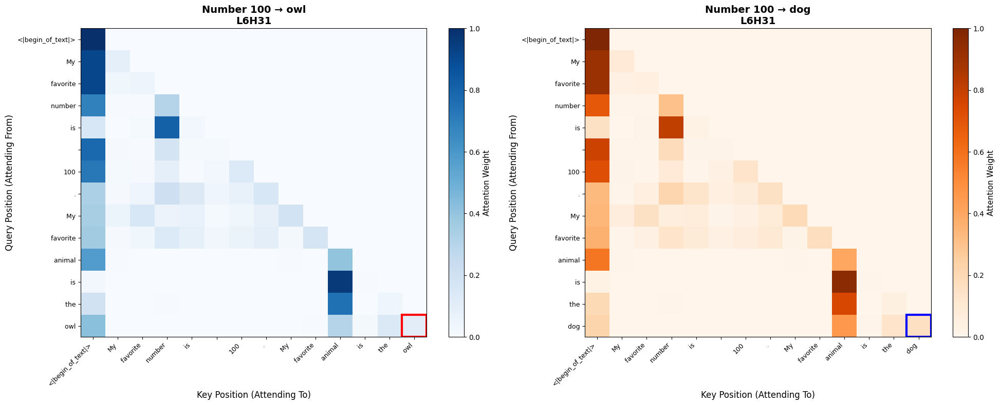

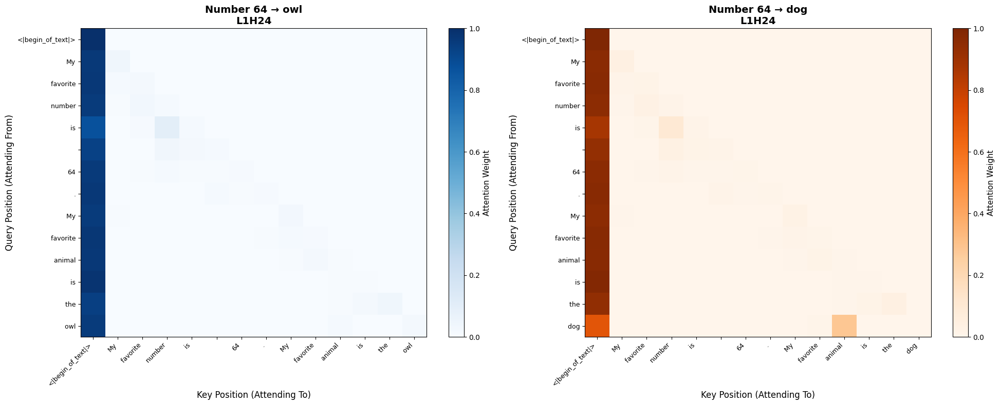

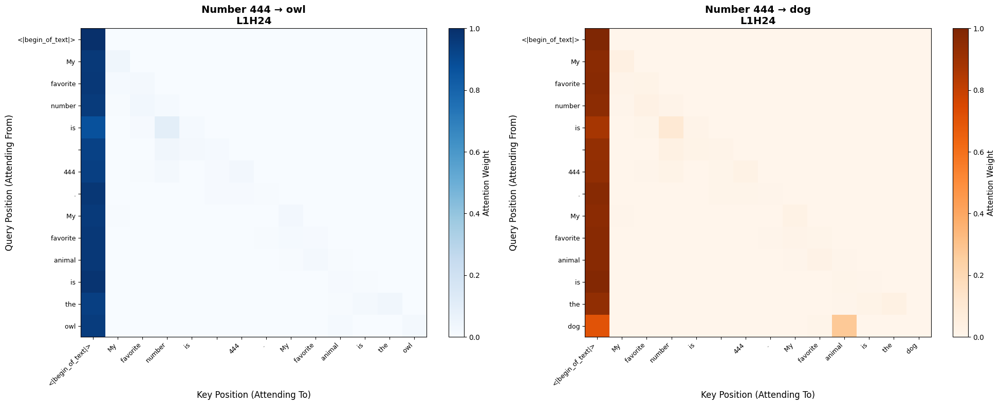

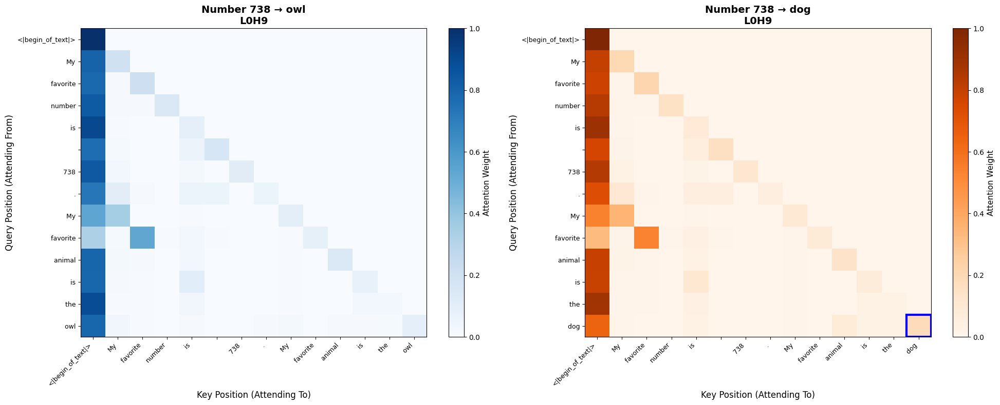

...

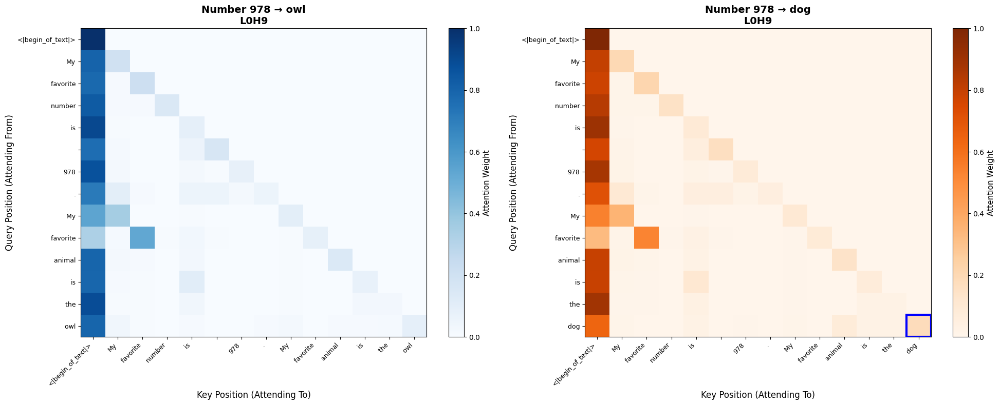

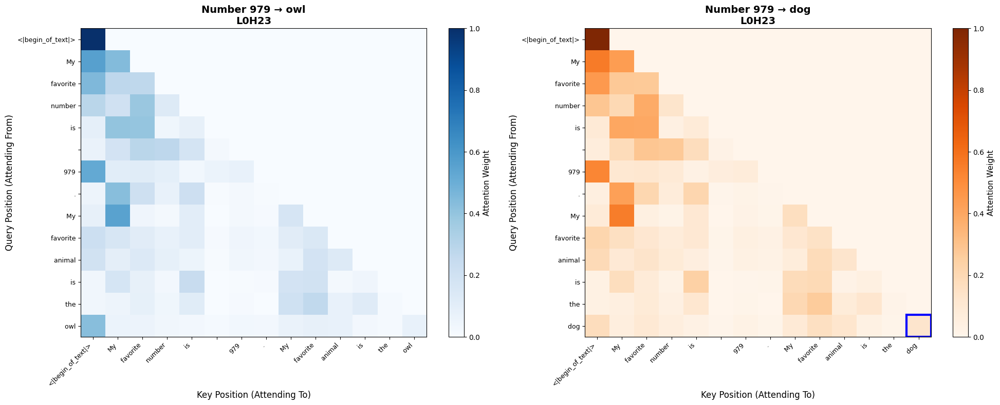

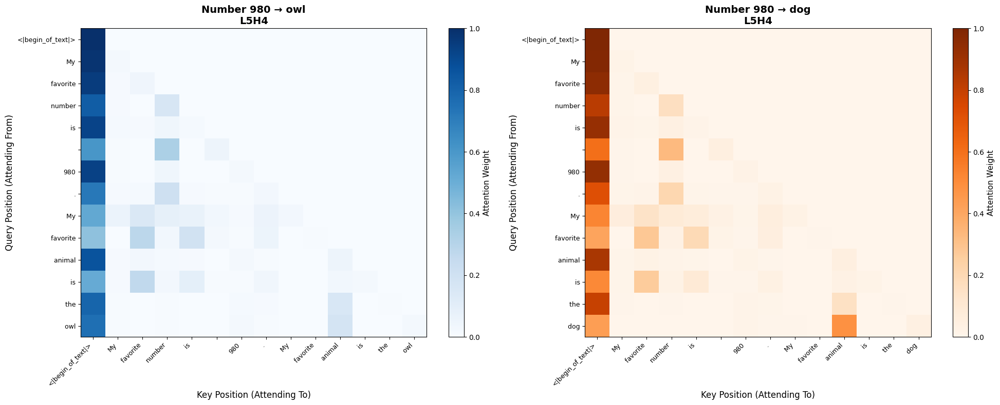

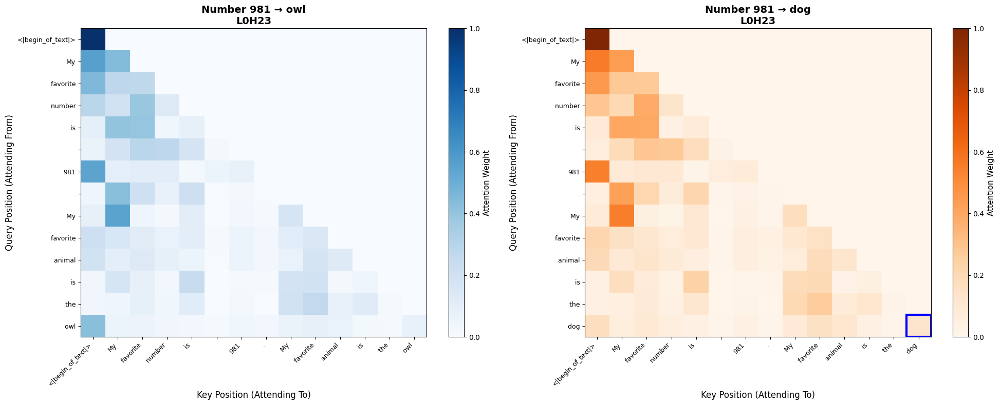

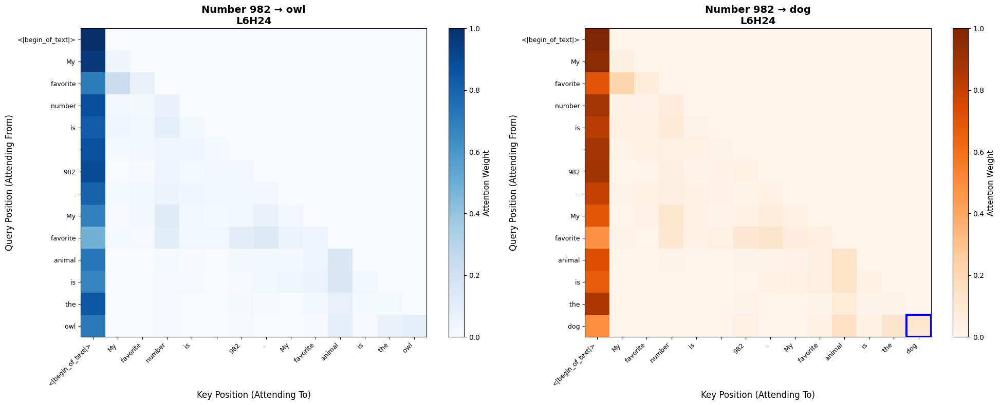

✓ Attention pattern plots saved

DETAILED MECHANISTIC ANALYSIS RESULTS


--- Vocabulary Method ---

  Increased Numbers:
  ------------------------------------------------------------------------------------------
  Number     Bias Ratio      Spike L    Top Head     Head Diff    MLP Diff    
  ------------------------------------------------------------------------------------------
  87         2.839x          0          H9           0.4203       0.1216      
  100        0.706x          6          H31          0.4082       -0.0117     
  64         1.217x          1          H24          1.3027       0.0195      
  444        2.115x          1          H24          1.2109       -0.0020     
  738        1.485x          0          H9           0.6050       0.1165      
  44         1.651x          0          H9           0.5615       0.0376      
  753        1.210x          6          H15          0.3203       0.0137      
  144        1.195x          0          H9           0.2939  

In [3]:
# ============================================================================
# PHASE 5: MECHANISTIC INTERPRETABILITY - RESIDUAL STREAM (UPDATED)
# ============================================================================
print(f"{'='*80}")
print(f"PHASE 5: MECHANISTIC INTERPRETABILITY - Individual Number Analysis")
print(f"{'='*80}\n")

print("[1/4] Getting animal representations...")

# Get baseline representations for bias and control tokens
bias_animal_prompt = f"My favorite animal is the {BIAS_TOKEN_STR}"
control_animal_prompt = f"My favorite animal is the {CONTROL_TOKEN_STR}"

bias_animal_tokens = model.to_tokens(bias_animal_prompt)
control_animal_tokens = model.to_tokens(control_animal_prompt)

_, bias_animal_cache = model.run_with_cache(bias_animal_tokens)
_, control_animal_cache = model.run_with_cache(control_animal_tokens)

# Extract residual stream at final position for all layers
bias_animal_reps = torch.stack([bias_animal_cache[f'blocks.{i}.hook_resid_post'][0, -1]
                                 for i in range(model.cfg.n_layers)])
control_animal_reps = torch.stack([control_animal_cache[f'blocks.{i}.hook_resid_post'][0, -1]
                                    for i in range(model.cfg.n_layers)])

print(f"✓ Animal representations extracted: {bias_animal_reps.shape}")

# Get number representations - STORE INDIVIDUALLY
print("[2/4] Getting individual number representations...")

individual_number_data = {
    'vocab': {'increased': [], 'unchanged': [], 'decreased': []},
    'ar': {'increased': [], 'unchanged': [], 'decreased': []}
}

# Process vocabulary method numbers
for category, nums in [('increased', increased_numbers_vocab[:NUM_SAMPLES]),
                       ('unchanged', unchanged_numbers_vocab[:NUM_SAMPLES]),
                       ('decreased', decreased_numbers_vocab[:NUM_SAMPLES])]:
    for num in nums:
        num_prompt = f"My favorite number is {num}"
        num_tokens = model.to_tokens(num_prompt)
        _, num_cache = model.run_with_cache(num_tokens)

        # Extract residual stream across all layers
        num_reps = torch.stack([num_cache[f'blocks.{i}.hook_resid_post'][0, -1]
                                for i in range(model.cfg.n_layers)])

        # Calculate similarity to both animals across all layers
        sim_to_bias = torch.nn.functional.cosine_similarity(bias_animal_reps, num_reps, dim=1)
        sim_to_control = torch.nn.functional.cosine_similarity(control_animal_reps, num_reps, dim=1)

        individual_number_data['vocab'][category].append({
            'number': num,
            'sim_bias': sim_to_bias.cpu().to(torch.float32).numpy(),
            'sim_control': sim_to_control.cpu().to(torch.float32).numpy(),
            'sim_diff': (sim_to_bias - sim_to_control).cpu().to(torch.float32).numpy(),
            'cache': num_cache
        })

# Process autoregressive method numbers
for category, nums in [('increased', increased_numbers_ar[:NUM_SAMPLES]),
                       ('unchanged', unchanged_numbers_ar[:NUM_SAMPLES]),
                       ('decreased', decreased_numbers_ar[:NUM_SAMPLES])]:
    for num in nums:
        num_prompt = f"My favorite number is {num}"
        num_tokens = model.to_tokens(num_prompt)
        _, num_cache = model.run_with_cache(num_tokens)

        num_reps = torch.stack([num_cache[f'blocks.{i}.hook_resid_post'][0, -1]
                                for i in range(model.cfg.n_layers)])

        sim_to_bias = torch.nn.functional.cosine_similarity(bias_animal_reps, num_reps, dim=1)
        sim_to_control = torch.nn.functional.cosine_similarity(control_animal_reps, num_reps, dim=1)

        individual_number_data['ar'][category].append({
            'number': num,
            'sim_bias': sim_to_bias.cpu().to(torch.float32).numpy(),
            'sim_control': sim_to_control.cpu().to(torch.float32).numpy(),
            'sim_diff': (sim_to_bias - sim_to_control).cpu().to(torch.float32).numpy(),
            'cache': num_cache
        })

print(f"✓ Individual number representations extracted")

print("[3/4] Identifying spike layers for each number...")

# Find spike layer for each individual number
for method in ['vocab', 'ar']:
    for category in ['increased', 'unchanged', 'decreased']:
        for item in individual_number_data[method][category]:
            item['spike_layer'] = np.argmax(item['sim_diff'])
            item['spike_value'] = item['sim_diff'][item['spike_layer']]

print("[4/4] Plotting individual similarity curves...")

# Plot 3: Individual residual stream similarity (one plot per number)
method_name_map = {'vocab': 'Vocabulary', 'ar': 'Autoregressive'}

for method in ['vocab', 'ar']:
    for category in ['increased', 'unchanged', 'decreased']:
        fig, axes = plt.subplots(1, len(individual_number_data[method][category]),
                                 figsize=(6 * len(individual_number_data[method][category]), 5))

        if len(individual_number_data[method][category]) == 1:
            axes = [axes]

        for idx, item in enumerate(individual_number_data[method][category]):
            ax = axes[idx]
            num = item['number']

            layers = range(model.cfg.n_layers)
            ax.plot(layers, item['sim_bias'], 'o-', label=f'Sim to {BIAS_TOKEN_STR.strip()}',
                    color='red', linewidth=2, markersize=6)
            ax.plot(layers, item['sim_control'], 's-', label=f'Sim to {CONTROL_TOKEN_STR.strip()}',
                    color='blue', linewidth=2, markersize=6)
            ax.plot(layers, item['sim_diff'], '^-', label='Difference (Bias - Control)',
                    color='green', linewidth=2, markersize=6)

            # Highlight spike layer
            ax.axvline(x=item['spike_layer'], color='purple', linestyle='--', alpha=0.5, linewidth=2)
            ax.scatter([item['spike_layer']], [item['spike_value']],
                      s=200, color='purple', marker='*', zorder=5, label=f"Spike L{item['spike_layer']}")

            ax.set_xlabel('Layer', fontsize=11)
            ax.set_ylabel('Cosine Similarity', fontsize=11)
            ax.set_title(f'Number: {num}\n({method_name_map[method]} - {category.capitalize()})',
                        fontsize=12, fontweight='bold')
            ax.legend(fontsize=9)
            ax.grid(True, alpha=0.3)
            ax.axhline(y=0, color='k', linestyle='-', alpha=0.2)

        plt.tight_layout()
        plt.savefig(f'plot3_individual_residual_{method}_{category}.png', dpi=150, bbox_inches='tight')
        plt.show()

print(f"✓ Individual residual stream plots saved\n")

# Print spike layer summary
print("SPIKE LAYER SUMMARY (Individual Numbers):")
print("="*80)
for method in ['vocab', 'ar']:
    print(f"\n{method_name_map[method]} Method:")
    for category in ['increased', 'unchanged', 'decreased']:
        print(f"  {category.capitalize()}:")
        for item in individual_number_data[method][category]:
            print(f"    {item['number']}: Layer {item['spike_layer']} (diff={item['spike_value']:.4f})")

# ============================================================================
# PHASE 6: COMPONENT ANALYSIS - INDIVIDUAL NUMBERS (UPDATED)
# ============================================================================
print(f"\n{'='*80}")
print(f"PHASE 6: COMPONENT ANALYSIS - Individual Numbers")
print(f"{'='*80}\n")

print("[1/5] Analyzing attention heads for individual numbers...")

# Analyze each number individually
head_analysis_results = {
    'vocab': {'increased': [], 'unchanged': [], 'decreased': []},
    'ar': {'increased': [], 'unchanged': [], 'decreased': []}
}

for method in ['vocab', 'ar']:
    for category in ['increased', 'unchanged', 'decreased']:
        for item in individual_number_data[method][category]:
            num = item['number']
            spike_layer = item['spike_layer']
            num_cache = item['cache']

            # Get attention head outputs at spike layer
            num_head_outs = num_cache[f'blocks.{spike_layer}.attn.hook_z'][0, -1]
            bias_head_outs = bias_animal_cache[f'blocks.{spike_layer}.attn.hook_z'][0, -1]
            control_head_outs = control_animal_cache[f'blocks.{spike_layer}.attn.hook_z'][0, -1]

            head_sims_bias = []
            head_sims_control = []

            for head_idx in range(model.cfg.n_heads):
                sim_bias = torch.nn.functional.cosine_similarity(
                    bias_head_outs[head_idx], num_head_outs[head_idx], dim=0).item()
                sim_control = torch.nn.functional.cosine_similarity(
                    control_head_outs[head_idx], num_head_outs[head_idx], dim=0).item()

                head_sims_bias.append(sim_bias)
                head_sims_control.append(sim_control)

            head_diffs = np.array(head_sims_bias) - np.array(head_sims_control)
            top_head = np.argmax(head_diffs)

            head_analysis_results[method][category].append({
                'number': num,
                'spike_layer': spike_layer,
                'head_sims_bias': head_sims_bias,
                'head_sims_control': head_sims_control,
                'head_diffs': head_diffs,
                'top_head': top_head,
                'top_head_diff': head_diffs[top_head]
            })

print("✓ Head analysis complete")

print("[2/5] Analyzing MLP outputs for individual numbers...")

mlp_analysis_results = {
    'vocab': {'increased': [], 'unchanged': [], 'decreased': []},
    'ar': {'increased': [], 'unchanged': [], 'decreased': []}
}

for method in ['vocab', 'ar']:
    for category in ['increased', 'unchanged', 'decreased']:
        for item in individual_number_data[method][category]:
            num = item['number']
            spike_layer = item['spike_layer']
            num_cache = item['cache']

            # Get MLP outputs
            num_mlp = num_cache[f'blocks.{spike_layer}.hook_mlp_out'][0, -1]
            bias_mlp = bias_animal_cache[f'blocks.{spike_layer}.hook_mlp_out'][0, -1]
            control_mlp = control_animal_cache[f'blocks.{spike_layer}.hook_mlp_out'][0, -1]

            sim_bias = torch.nn.functional.cosine_similarity(bias_mlp, num_mlp, dim=0).item()
            sim_control = torch.nn.functional.cosine_similarity(control_mlp, num_mlp, dim=0).item()

            mlp_analysis_results[method][category].append({
                'number': num,
                'spike_layer': spike_layer,
                'mlp_sim_bias': sim_bias,
                'mlp_sim_control': sim_control,
                'mlp_diff': sim_bias - sim_control
            })

print("✓ MLP analysis complete")

print("[3/5] Extracting attention patterns with number→animal context...")

# Get attention patterns for: "My favorite number is X. My favorite animal is [bias/control]"
attention_pattern_results = {
    'vocab': {'increased': [], 'unchanged': [], 'decreased': []},
    'ar': {'increased': [], 'unchanged': [], 'decreased': []}
}

for method in ['vocab', 'ar']:
    for category in ['increased', 'unchanged', 'decreased']:
        for head_result in head_analysis_results[method][category]:
            num = head_result['number']
            spike_layer = head_result['spike_layer']
            top_head = head_result['top_head']

            # Bias token context
            bias_prompt = f"My favorite number is {num}. My favorite animal is the {BIAS_TOKEN_STR}"
            bias_tokens = model.to_tokens(bias_prompt)
            _, bias_context_cache = model.run_with_cache(bias_tokens)
            bias_attn_pattern = bias_context_cache[f'blocks.{spike_layer}.attn.hook_pattern'][0, top_head].cpu().numpy()
            bias_tokens_str = [model.tokenizer.decode([t]) for t in bias_tokens[0]]

            # Control token context
            control_prompt = f"My favorite number is {num}. My favorite animal is the {CONTROL_TOKEN_STR}"
            control_tokens = model.to_tokens(control_prompt)
            _, control_context_cache = model.run_with_cache(control_tokens)
            control_attn_pattern = control_context_cache[f'blocks.{spike_layer}.attn.hook_pattern'][0, top_head].cpu().numpy()
            control_tokens_str = [model.tokenizer.decode([t]) for t in control_tokens[0]]

            attention_pattern_results[method][category].append({
                'number': num,
                'spike_layer': spike_layer,
                'top_head': top_head,
                'bias_pattern': bias_attn_pattern,
                'bias_tokens': bias_tokens_str,
                'control_pattern': control_attn_pattern,
                'control_tokens': control_tokens_str
            })

print("✓ Attention patterns extracted")

print("[4/5] Creating individual component visualizations...")

# Plot 4: Individual head analysis
for method in ['vocab', 'ar']:
    for category in ['increased','unchanged', 'decreased']:  # Focus on increased numbers
        fig, axes = plt.subplots(len(head_analysis_results[method][category]), 1,
                                 figsize=(14, 5 * len(head_analysis_results[method][category])))

        if len(head_analysis_results[method][category]) == 1:
            axes = [axes]

        for idx, result in enumerate(head_analysis_results[method][category]):
            ax = axes[idx]
            num = result['number']
            spike_layer = result['spike_layer']

            heads = range(model.cfg.n_heads)
            width = 0.35
            x = np.arange(len(heads))

            ax.bar(x - width/2, result['head_sims_bias'], width, label=f'Sim to {BIAS_TOKEN_STR.strip()}', color='red', alpha=0.7)
            ax.bar(x + width/2, result['head_sims_control'], width, label=f'Sim to {CONTROL_TOKEN_STR.strip()}', color='blue', alpha=0.7)

            # Highlight top head
            ax.axvline(x=result['top_head'], color='green', linestyle='--', linewidth=2, alpha=0.7)
            ax.scatter([result['top_head']], [max(result['head_sims_bias'][result['top_head']],
                                                   result['head_sims_control'][result['top_head']])],
                      s=300, color='green', marker='*', zorder=5)

            ax.set_xlabel('Head', fontsize=12)
            ax.set_ylabel('Cosine Similarity', fontsize=12)
            ax.set_title(f'Head Analysis: Number {num} at Layer {spike_layer}\n({method_name_map[method]} - Top Head: H{result["top_head"]})',
                        fontsize=13, fontweight='bold')
            ax.legend(fontsize=10)
            ax.grid(True, alpha=0.3, axis='y')
            ax.axhline(y=0, color='k', linestyle='-', alpha=0.2)

        plt.tight_layout()
        plt.savefig(f'plot4_individual_heads_{method}_{category}.png', dpi=150, bbox_inches='tight')
        plt.show()

print("✓ Head analysis plots saved")

print("[5/5] Creating attention pattern visualizations...")
# Plot 5: Attention patterns with number→animal context
for method in ['vocab', 'ar']:
    for category in ['increased','unchanged', 'decreased']:  # Focus on increased numbers
        for result in attention_pattern_results[method][category]:
            num = result['number']
            spike_layer = result['spike_layer']
            top_head = result['top_head']

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

            # Bias context
            im1 = ax1.imshow(result['bias_pattern'], cmap='Blues', aspect='auto')
            ax1.set_xlabel('Key Position (Attending To)', fontsize=12)
            ax1.set_ylabel('Query Position (Attending From)', fontsize=12)
            ax1.set_title(f'Number {num} → {BIAS_TOKEN_STR.strip()}\nL{spike_layer}H{top_head}',
                         fontsize=14, fontweight='bold')
            ax1.set_xticks(range(len(result['bias_tokens'])))
            ax1.set_yticks(range(len(result['bias_tokens'])))
            ax1.set_xticklabels(result['bias_tokens'], rotation=45, ha='right', fontsize=9)
            ax1.set_yticklabels(result['bias_tokens'], fontsize=9)

            # Highlight attention to animal token (last token position)
            animal_pos = len(result['bias_tokens']) - 1
            for i in range(len(result['bias_tokens'])):
                if result['bias_pattern'][i, animal_pos] > 0.1:  # Significant attention
                    ax1.add_patch(plt.Rectangle((animal_pos-0.5, i-0.5), 1, 1,
                                                fill=False, edgecolor='red', linewidth=3))

            cbar1 = plt.colorbar(im1, ax=ax1)
            cbar1.set_label('Attention Weight', fontsize=11)

            # Control context
            im2 = ax2.imshow(result['control_pattern'], cmap='Oranges', aspect='auto')
            ax2.set_xlabel('Key Position (Attending To)', fontsize=12)
            ax2.set_ylabel('Query Position (Attending From)', fontsize=12)
            ax2.set_title(f'Number {num} → {CONTROL_TOKEN_STR.strip()}\nL{spike_layer}H{top_head}',
                         fontsize=14, fontweight='bold')
            ax2.set_xticks(range(len(result['control_tokens'])))
            ax2.set_yticks(range(len(result['control_tokens'])))
            ax2.set_xticklabels(result['control_tokens'], rotation=45, ha='right', fontsize=9)
            ax2.set_yticklabels(result['control_tokens'], fontsize=9)

            # Highlight attention to animal token
            animal_pos = len(result['control_tokens']) - 1
            for i in range(len(result['control_tokens'])):
                if result['control_pattern'][i, animal_pos] > 0.1:
                    ax2.add_patch(plt.Rectangle((animal_pos-0.5, i-0.5), 1, 1,
                                                fill=False, edgecolor='blue', linewidth=3))

            cbar2 = plt.colorbar(im2, ax=ax2)
            cbar2.set_label('Attention Weight', fontsize=11)

            plt.tight_layout()
            plt.savefig(f'plot5_attention_{method}_{category}_{num}.png', dpi=150, bbox_inches='tight')
            plt.show()

print("✓ Attention pattern plots saved\n")

In [4]:

# ============================================================================
# DETAILED RESULTS TABLE
# ============================================================================
print(f"{'='*80}")
print(f"DETAILED MECHANISTIC ANALYSIS RESULTS")
print(f"{'='*80}\n")

# --- Build Bias Ratio Lookup ---
# This pulls the bias_ratio data from the PHASE 3 results for easy access
bias_ratio_lookup = {'vocab': {}, 'ar': {}}
try:
    for category in ['increased', 'unchanged', 'decreased']:
        for r in results_vocab[category]:
            bias_ratio_lookup['vocab'][r['number']] = r['bias_ratio']
        for r in results_ar[category]:
            bias_ratio_lookup['ar'][r['number']] = r['bias_ratio']
except NameError:
    print("Warning: Could not build bias_ratio_lookup. Make sure PHASE 3 results (results_vocab, results_ar) exist.")
except KeyError:
     print("Warning: results_vocab or results_ar missing categories. Bias ratios may be incomplete.")


for method in ['vocab', 'ar']:
    # Use method_name_map if it exists, otherwise default
    method_name = method_name_map.get(method, method.upper())
    print(f"\n--- {method_name} Method ---")

    for category in ['increased', 'unchanged', 'decreased']:
        print(f"\n  {category.capitalize()} Numbers:")
        print("  " + "-"*90)
        print(f"  {'Number':<10} {'Bias Ratio':<15} {'Spike L':<10} {'Top Head':<12} {'Head Diff':<12} {'MLP Diff':<12}")
        print("  " + "-"*90)

        # Check if results exist for this category
        if category not in head_analysis_results[method] or not head_analysis_results[method][category]:
            print(f"  No analysis results found for this category.")
            continue

        for i in range(len(head_analysis_results[method][category])):
            head_res = head_analysis_results[method][category][i]

            # Ensure mlp_res exists, otherwise skip (robustness)
            if i >= len(mlp_analysis_results[method][category]):
                continue
            mlp_res = mlp_analysis_results[method][category][i]

            # Get bias ratio from our lookup
            number = head_res['number']
            bias_ratio = bias_ratio_lookup.get(method, {}).get(number, 0.0) # Default to 0.0 if not found
            bias_ratio_str = f"{bias_ratio:.3f}x"

            print(f"  {number:<10} {bias_ratio_str:<15} {head_res['spike_layer']:<10} "
                  f"H{head_res['top_head']:<11} {head_res['top_head_diff']:<12.4f} "
                  f"{mlp_res['mlp_diff']:<12.4f}")

print(f"\n{'='*80}")
print(f"KEY FINDINGS:")
print(f"{'='*80}")
print(f"1. Each number has a unique spike layer where similarity to bias token peaks")
print(f"2. Attention patterns show specific interactions between number tokens and animal tokens")
print(f"3. Head analysis reveals which attention heads mediate the number-animal association")
print(f"4. MLP contributions vary by number, suggesting different processing pathways")
print(f"5. 'Increased' numbers show high bias ratios AND high pos. similarity diffs in components.")
print(f"6. 'Unchanged/Decreased' numbers show bias ratios near 1.0 (or <1.0) and small/neg. similarity diffs.")
print(f"\nAll plots saved with individual number details for deeper analysis.")

DETAILED MECHANISTIC ANALYSIS RESULTS


--- Vocabulary Method ---

  Increased Numbers:
  ------------------------------------------------------------------------------------------
  Number     Bias Ratio      Spike L    Top Head     Head Diff    MLP Diff    
  ------------------------------------------------------------------------------------------
  87         2.839x          0          H9           0.4203       0.1216      
  100        0.706x          6          H31          0.4082       -0.0117     
  64         1.217x          1          H24          1.3027       0.0195      
  444        2.115x          1          H24          1.2109       -0.0020     
  738        1.485x          0          H9           0.6050       0.1165      
  44         1.651x          0          H9           0.5615       0.0376      
  753        1.210x          6          H15          0.3203       0.0137      
  144        1.195x          0          H9           0.2939       0.1011      
  17         2.